In [85]:
import numpy as np
import pandas as pd
import pylab as plt
import seaborn as sns

from sklearn.datasets import make_classification
from sklearn import svm
from sklearn.svm import SVC
from matplotlib.colors import ListedColormap
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_blobs
from sklearn.preprocessing import PolynomialFeatures
%pylab inline

cm_bright = ListedColormap(['#FF0000', '#0000FF'])
sns.set_style('whitegrid')
pylab.rcParams['figure.figsize'] = (12.0, 5.0)

import warnings
warnings.filterwarnings('ignore')

Populating the interactive namespace from numpy and matplotlib


# Linear SVM reminder

Рассмотрим задачу бинарной классификации. Обучающие выборки заданы $\{(x_n, y_n)\}_{n=1}^N$, где $N$ - количество объектов, $\boldsymbol x_n \in \mathbb{R}^d$ - вектор признаков объекта, $y_n \in \{+1, -1\}$ - класс объекта.

SVM обучает модель для разделения гиперплоскостей:
$$f(\boldsymbol x) = \boldsymbol w^T \boldsymbol x + b$$

Параметры модели - вектор весов $\boldsymbol w \in \mathbb{R}^d$ и смещение $b \in \mathbb{R}$

Обучение осуществляется путем решения оптимизационной задачи:
$$\begin{gather}\frac{1}{2} \| \boldsymbol w \|^2 + C \sum_{n=1}^N \xi_n \to \min_{\boldsymbol w, \boldsymbol \xi, b}\\\\ \text{s.t.: } \quad y_n (\boldsymbol w^T \boldsymbol x_n + b) \geq 1 - \xi_n, \quad \xi_n \geq 0, \quad \forall n=1,\dots,N\, \end{gather}$$

Ограничение $y_n (\boldsymbol w^T \boldsymbol x_n + b) \geq 1$ гарантирует, что объекты правильно классифицированы разделяющей гиперплоскостью. Так как на практике выборка не может быть линейно разделяемой, вводится слабая переменная $\xi_n$, которая ослабляет условие правильной классификации. $\| \boldsymbol w \|^2$ штрафует за малую ширину полей $\sum_n \xi_n$ наказывает за ослабление ограничений

Решение оптимизационной задачи дается $(\boldsymbol w_{\star}, \boldsymbol \xi_{\star}, b_{\star})$.При этом некоторые ограничения становятся активными, т.е. превращаются в точное равенство:
$$\quad y_n (\boldsymbol w_{\star}^T \boldsymbol x_n + b_{\star}) = 1 - \xi_{\star,n}$$

Объекты, соответствующие активным ограничениям, называемым $\textbf{опорные вектора}$

Гиперпараметр $C$ отвечает за балансировку ширины маржи и ошибок, совершаемых классификатором. Он показывает обобщающее свойство разделяющей гиперплоскости - большие значения параметра $C$ означает низкую регуляризацию, что приводит к очень хорошей подгонке обучающих данных, но может вызвать перебор, с другой стороны, меньшее значение $C$ означает большую регуляризацию, что делает модель более обобщаемой, но может привести к недостаточной подгонке. если данные хорошо описываются линейной моделью. Чтобы выбрать $C$ необходимо провести кросс-валидацию на валидационном множестве, чтобы найти наилучшее значение.

---

SVM (Support Vector Machine) - это метод машинного обучения, используемый для классификации и регрессии. Он основан на поиске оптимальной разделяющей гиперплоскости, которая максимально разделяет два класса объектов. SVM строит гиперплоскость в n-мерном пространстве, где n - это количество признаков объектов.

Для обучения SVM мы передаем ему набор данных, который состоит из множества объектов и их меток классов. SVM пытается найти оптимальную разделяющую гиперплоскость, которая разделяет объекты разных классов и максимизирует расстояние от гиперплоскости до ближайших объектов каждого класса. Это расстояние называется зазором (margin), и SVM стремится максимизировать его для улучшения обобщающей способности модели.

При обучении SVM оптимизирует функцию потерь, которая штрафует за ошибки классификации и учитывает зазор между объектами и разделяющей гиперплоскостью. Для поиска оптимальной гиперплоскости SVM использует метод оптимизации под названием "Quadratic Programming"

# Реализация

В sklearn существует два варианта реализации линейной SVM: LinearSVC и SVC с линейным ядром. Они построены на разных библиотеках, с решаемой оптимизационной задачей liblinear в первом случае и libsvm во втором.

Здесь мы будем использовать sklearn.svm.SVC с ядром='linear'.

Мы генерируем выборки данных с:

- линейно разделяемыми классами
- с хорошо разделяемыми классами, но не линейно
- с не разделяемыми классами.

# Функция, представленная ниже, предоставляет образцы изображений и данных креатинона. Ваша задача - использовать ее в соответствии со следующими упражнениями.

In [86]:
# функция svc_plotter используется для визуализации результатов классификации, полученных с 
# помощью SVM (Support Vector Machine)

# Из примеров sklearn SVC
'''
- classifiers - классификаторы SVM, которые необходимо визуализировать
- name - название классификаторов, которое будет отображаться на графике
- ploy_f - параметр, который определяет, будут ли использоваться полиномиальные функции для расширения
признаков 
- polynomial_expand - параметр, который определяет степень полиномиальной функции, если ploy_f 
установлен в True
''' 
def svc_plotter(classifiers, name, poly_f = False, polynomial_expand = None):
    # используется для создания сетки на графике, которая помогает визуализировать разделяющую
    # гиперплоскость
    h = .02 # размер шага в сетке
    
    # функция make_blobs из библиотеки sklearn.datasets
    X_sep, y_sep = make_blobs(n_samples = 400, # количество точек данных, которые необходимо сгенерировать.
                              n_features = 2, # количество признаков (размерность) для каждой точки данных
                              centers = 2, # количество центров (кластеров), которые необходимо сгенерировать
                              cluster_std = 1.5, # стандартное отклонение для каждого кластера
                              random_state = 42) # сид
    # X_sep - содержит входные признаки сгенерированного набора данных ((n_samples, n_features))
    # y_sep - содержит метки целевых классов набора данных ((n_samples))
    linearly_separable = (X_sep, y_sep) # сохраняем сгенерированные данные
    
    # функция make_classification из библиотеки sklearn.datasets
    X, y = make_classification(n_samples = 400, # количество образцов в наборе данных
                               n_features = 2, # количество признаков в кадом образце
                               n_redundant = 0, # количество избыточных признаков в каждом образце, они не содержат полезной информации для классификации
                               n_informative = 2, # количество информативных признаков в каждом образце. Информативные признаки помогают разделять классы
                               random_state = 231, # cид
                               n_clusters_per_class = 1) # количество кластеров на каждый класс
    
    rng = np.random.RandomState(2) # создаем генереатор случайных чисел с начальным значением 2
    # добавляет случайный шум к матрице данных X. rng.uniform() генерирует случайгые числа в нтервале
    # от 0 до 1 и добавляет 15, чтобы увеличить дисперсию шума
    X += 15 * rng.uniform(size = X.shape) 
    linearly_bad_sqparable = (X, y) # сохраняем сгенерированнаые данные в кортеж
    
    # создает список из трех наборов данных
    datasets = [linearly_separable, 
                linearly_bad_sqparable,
                
                # создает два вложенных круга
                make_circles(n_samples = 400, #количество объектов
                             noise = 0.05, # уровень шума
                             random_state = 42)] #сид
    
    # итерация по наборам данных
    f, axes = plt.subplots(len(datasets), # количество строк
                           len(classifiers), # столбцов
                           figsize = (20, 20))
    
    for ds_cnt, ds in enumerate(datasets):
        # предварительная обработка набора данных, разделение на обучающую и тестовую выборки
        X, y = ds # присваивает X и y значения из текущего набора данных.
        X = StandardScaler().fit_transform(X) # применяет стандартизацию к данным в X, чтобы они имели среднее значение 0 и единичное стандартное отклонение
        X_train, X_test, y_train, y_test = train_test_split(X, 
                                                            y, 
                                                            test_size = .4, # тесовая выборка 40 проценов
                                                            random_state = 42) # сид
        
        x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5 #  находит минимальное и максимальное значения для первого признака в X и добавляет или вычитает 0,5, чтобы получить дополнительное пространство вокруг графика
        y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
        xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                             np.arange(y_min, y_max, h)) # создает сетку точек, которые будут использоваться для построения графика. Она начинается с минимальных значений признаков и заканчивается максимальными значениями с шагом h
        # переборка классификаторов
        # этот код относится к обучению нескольких классификаторов на различных наборах данных. Он итерируется по каждому классификатору в списке classifiers и выполняет ->
        index = 0
        for clf in classifiers:
            # если переменная poly_f равна True
            if poly_f: 
                # то выполняется многочленное расширение признаков с использованием polynomial_expand,
                # затем обучается классификатор clf на полученных данных X_train и y_train
                clf.fit(polynomial_expand.fit_transform(X_train), y_train) 
            else:
                # иначе обучается классификатор clf на исходных данных X_train и y_train
                clf.fit(X_train, y_train)
            ax = axes[ds_cnt, index] # присваивает переменной ax текущую область построения графика на основе значения ds_cnt и index в массиве axes
            index += 1 # увеличивает значение переменной index на 1 для перехода к следующей области построения графика
            
            # Постройте границу принятия решения. Для этого мы присвоим цвет каждой
            # точке в сетке [x_min, x_max]x[y_amin, y_max].
            # поддерживает ли классификатор метод decision_function. Если да, то рассматривается принадлежность точек к разделяющей гиперплоскости
            if hasattr(clf, 'decision_function'):
                # нужно ли применять полиномиальное расширение признаков с помощью polynomial_expand.transform
                if poly_f:
                    # вычисляет значения функции решения на сетке точек, если используется полиномиальное расширение
                    Z = clf.decision_function(polynomial_expand.transform(np.c_[xx.ravel(), yy.ravel()])) 
                else:
                    # если не используется полиномиальное расширение
                    Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
            # иначе используется метод predict_proba
            else:
                # вычисляет вероятности принадлежности точек к положительному классу
                Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]
            # Выведите результат на цветной график
            Z = Z.reshape(xx.shape) # изменяет форму массива Z до тех пор, пока он не соответствует форме сетки xx
            # ax.pcolormesh(xx, yy, Z > 0, cmap=plt.cm.Paired)
            
            # создает заполненные контуры уровня решения на графике, используя значения функции решения Z
            ax.contourf(xx, 
                        yy, 
                        Z, 
                        cmap=cm.RdBu, # выбор цветовой карты для отображения контуров
                        alpha=.8, # задает прозрачность заполнения
                        linestyles=['--', '-', '--'], # задает стиль линий для каждого уровня решения
                        levels=[-1, 0, 1]) # задает значения уровней решения
            ax.contour(xx, 
                       yy, 
                       Z, 
                       colors=['k', 'k', 'k'], # задает цвет для каждого уровня решения
                       linestyles=['--', '-', '--'], # стиль линий для каждого уровня решения
                       levels=[-1, 0, 1]) # задает значения уровней решения
            
#           support vectors
#           ax.scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1], s=80, facecolors='none', zorder=10)

            # код относится к разделению обучающих данных на два класса в зависимости от их принадлежности к 
            # положительному или отрицательному классу
            if poly_f: # проверяет, нужно ли применять полиномиальное расширение признаков с помощью polynomial_expand.fit_transform
                # применяет полиномиальное расширение признаков к обучающим данным и сохраняет результат в poly_features
                poly_features = polynomial_expand.fit_transform(X_train)
                # разделяет обучающие данные на два класса, если значение y_train равно 0, то соответствующие строки из 
                # poly_features добавляются в первый класс, иначе они добавляются во второй класс. 
                train_classes = [poly_features[~y_train.astype(bool)], poly_features[y_train.astype(bool)]] 
            else: # иначе обучающие данные не расширяются полиномиально, и они разделяются на два класса на основе значения y_train
                # азделяет обучающие данные на два класса, если значение y_train равно 0, то соответствующие строки из X_train
                # добавляются в первый класс, иначе они добавляются во второй класс 
                train_classes = [X_train[~y_train.astype(bool)], X_train[y_train.astype(bool)]] 
            
            # создание диаграммы рассеяния точек на графике
            ax.scatter(clf.support_vectors_[:, 0], # первый признак из массива опорных векторов
                       clf.support_vectors_[:, 1], # второй признак из массива опорных векторов
                       s = 180, # размер точек на графике
                       facecolors = 'none', # цвет точек, none означает, что внутренняя часть точки будет прозрачной
                       zorder = 10, # порядок отображения на графике. Чем больше значение, тем выше находится точка на графике
                       edgecolors = 'black', # цвет контура точек
                       linewidths = 0.5) # толщина линии контура точек
            
            # Постройте также точки обучения
            ax.scatter(X_train[:, 0], 
                       X_train[:, 1], 
                       c = y_train, # Каждая точка на диаграмме имеет свой цвет, который определяется вектором y_train
                       cmap = cm_bright, # цветовая карта 
                       alpha = 0.3, # прозрачнотсь
                       s = 36) # размер
            # и точки тестирования
            ax.scatter(X_test[:, 0],
                       X_test[:, 1],
                       c = y_test, # Каждая точка на диаграмме имеет свой цвет, который определяется вектором y_train
                       cmap = cm_bright, # цветовая карта 
                       alpha = 0.5, # прозрачнотсь
                       s = 36) # размер

            ax.set_xlim(xx.min(), xx.max()) # задает границы для оси X
            ax.set_ylim(yy.min(), yy.max()) # задает границы для оси y
            ax.set_xlabel("x_1") # задает подпись для оси X
            ax.set_ylabel("x_2") # задает подпись для оси Y
            ax.set_title(name[index - 1]) # задает заголовок для диаграммы, где name - это список названий классификаторов,
                                          # а index - это номер текущего классификатора в списке

# Задача 1

Варьируйте параметр C (в логарифмической шкале) и предоставьте список SVM с линейным ядром для функции. name - это список строк, обозначающих различные метки (значения c).

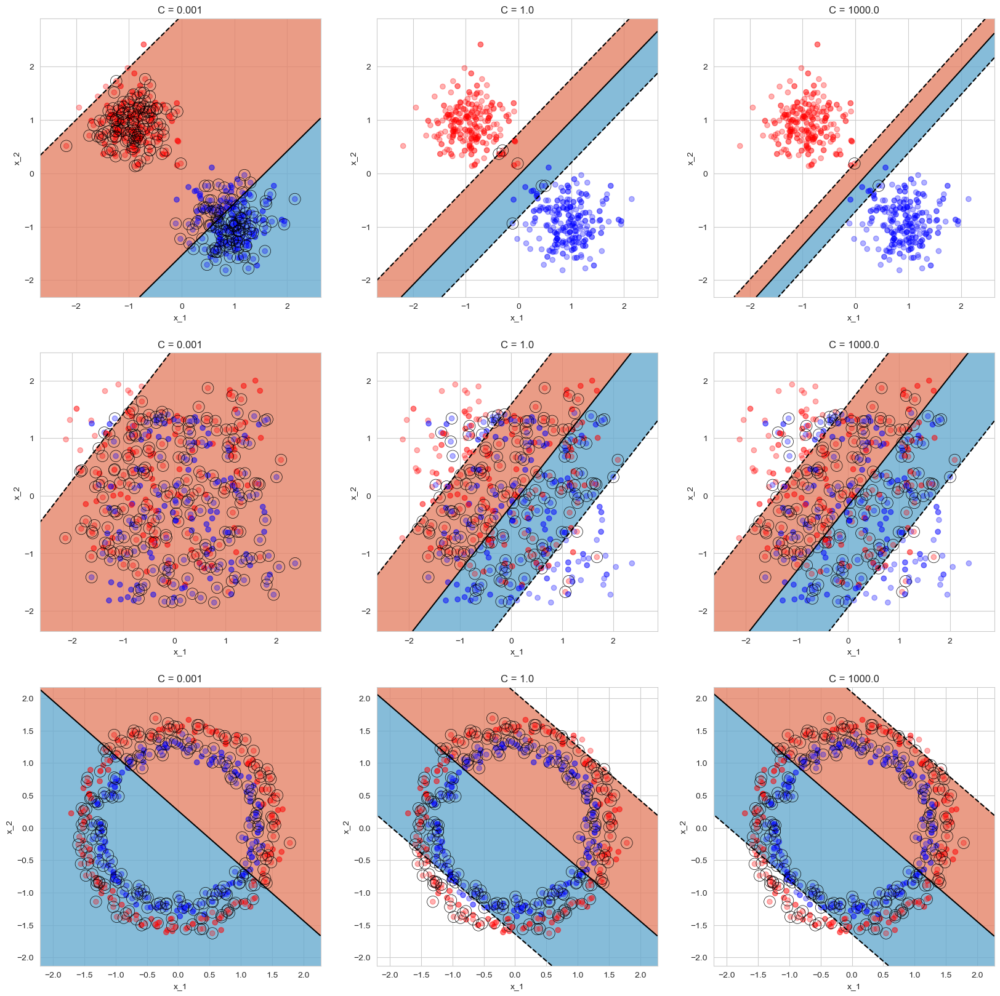

In [87]:
classifiers = []
name = []

# Создаем список значений параметра C в логарифмической шкале
# массив из 3 значений
# -3 начальное значение логарифма
# 3 конечное значение логарифма
C_range = np.logspace(-3, 3, num = 3)

# Создаем SVM с линейным ядром для каждого значения параметра C
for C in C_range:
    clf = SVC(kernel='linear', C = C) # классификатора SVM с линейным ядром и указанным значением C
    classifiers.append(clf) # Объект классификатора добавляется в список
    name.append("C = {}".format(C)) # обновляется строкой, которая указывает значение C для каждого классификатора

svc_plotter(classifiers, name)

# Задача 2

Как количество опорных векторов зависит от C на разных наборах данных? Извлеките информацию о векторах поддержки из SVC и постройте график: Количество опорных векторов VS значение C для всех 3 наборов данных, указанных ниже.

In [88]:
X_sep, y_sep = make_blobs(n_samples = 400, # 400 точек
                          n_features = 2, # 2 признака для каждой точки
                          centers = 2, # 2 кластера
                          cluster_std = 1.5, # кластеры имеют стандартное отклонение (чем больше значение, тем больше разброс)
                          random_state = 42) # сид
linearly_separable = (X_sep, y_sep)

X, y = make_classification(n_samples = 400, # точки
                           n_features = 2, # признаки 
                           n_redundant = 0, # кол-во избыточкных признаков, для усложнения задачи
                           n_informative = 2, # кол-во информативных признаков, влияют на классификацию используются для создания различий между класами
                           random_state = 231, # сид
                           n_clusters_per_class = 1) # кол-во кластеров на класс

# создает генератор случайных чисел rng с начальным состоянием 2. Это нужно для того, чтобы при каждом запуске программы 
# генерировались одни и те же случайные числа
rng = np.random.RandomState(2)
# добавляет к каждому элементу массива X случайное число из равномерного распределения на интервале 0, 1 и умноженное на 15
# Таким образом, каждый элемент массива X увеличивается на случайное значение из диапазона 0, 15
X += 15 * rng.uniform(size = X.shape)
# создает кортеж, который содержит массив X и y. Массив y содержит метки классов для каждого элемента массива X. В данном
# случае, массив y содержит только два класса 0 и 1
linearly_bad_separable = (X, y)

# создает список datasets, который содержит три разных набора данных для обучения и тестирования классификаторов
datasets = [linearly_separable, # двумерный набор данных, в котором объекты линейно разделимы на два класса
            linearly_bad_separable, # также представляет собой двумерный набор данных, но объекты в нем линейно плохо разделимы на два класса
            # представляет собой двумерный набор данных, объекты в нем образуют два круга, которые пересекаются
            make_circles(n_samples = 400, # точки
                         noise = 0.05, # шум
                         random_state = 42)] # сид

In [89]:
vectors = [] # список в который будем добавлять кортежи, содержащие количество опорных векторов 
paramd_grid = np.logspace(-3, 3, num = 20) # содержит значения параметра C, которые мы будем использовать для обучения SVM
for dataset in datasets:
    # YOUR CODE HERE
    support_vetors = [] # тут будут добавляться количество опорных векторов для каждого значения параметра C
    for C in paramd_grid:
        clf = SVC(C = C)
        clf.fit(dataset[0], dataset[1])
        support_vetors.append(len(clf.support_vectors_)) # количество опорных векторов для этого SVM добавляется в список
    # YOUR CODE HERE
    # будет содержать три кортежа, каждый из которых будет содержать количество опорных векторов для каждого 
    # значения параметра C
    vectors.append(support_vetors)

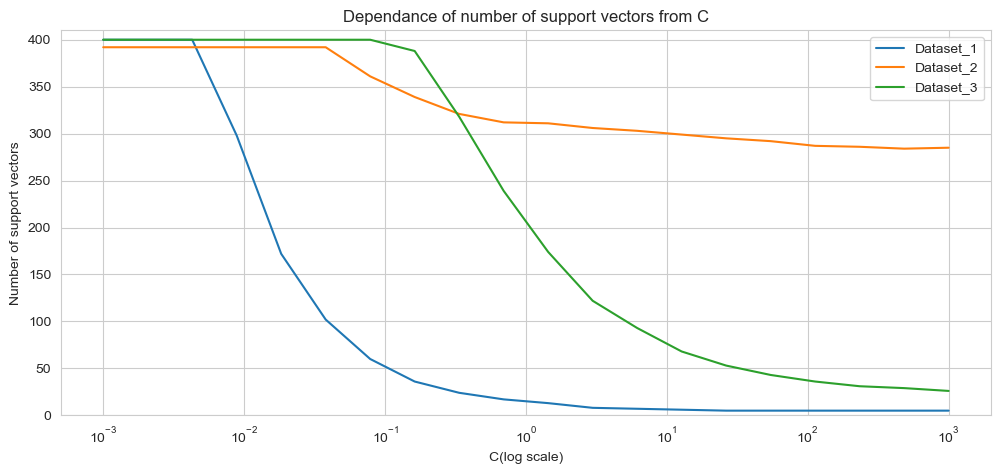

In [90]:
plt.figure
plt.plot(paramd_grid, vectors[0], label = 'Dataset_1')
plt.plot(paramd_grid, vectors[1], label = 'Dataset_2')
plt.plot(paramd_grid, vectors[2], label = 'Dataset_3')
plt.xscale('log')
plt.xlabel('C(log scale)')
plt.ylabel('Number of support vectors')
plt.ylim(0, 410)
plt.title("Dependance of number of support vectors from C")
plt.legend()

# Задача 3

Как видно, для набора данных 3 не существует линейной гиперплоскости (например, классы не могут быть разделены гиперплоскостью), поэтому для решения этой проблемы можно изменить пространство признаков, в котором линейная модель лучше описывает набор данных
$$\boldsymbol x \in \mathbb{R}^d \mapsto \phi(\boldsymbol x) \in \mathbb{R}^t$$
Например, добавление всех парных произведений признаков:
$$\phi(x_1, \dots, x_d) = (x_1, \dots, x_d, x_1^2, x_1x_2, \dots, x_d^2)$$
преобразование в пространство, где линейная гиперплоскость является квадратичной формой в исходном пространстве признаков.

[видео с демонстрацией](https://youtu.be/9NrALgHFwTo)

Помните вчерашнее выражение expand(X)? В sklearn есть модуль, который сделает это за вас, и не только. Взгляните на него.

Используйте $\textbf{sklearn.preprocessing PolynomialFeatures(with include_bias=False)}$ и постройте график результатов, как указано выше. Кратко опишите результаты

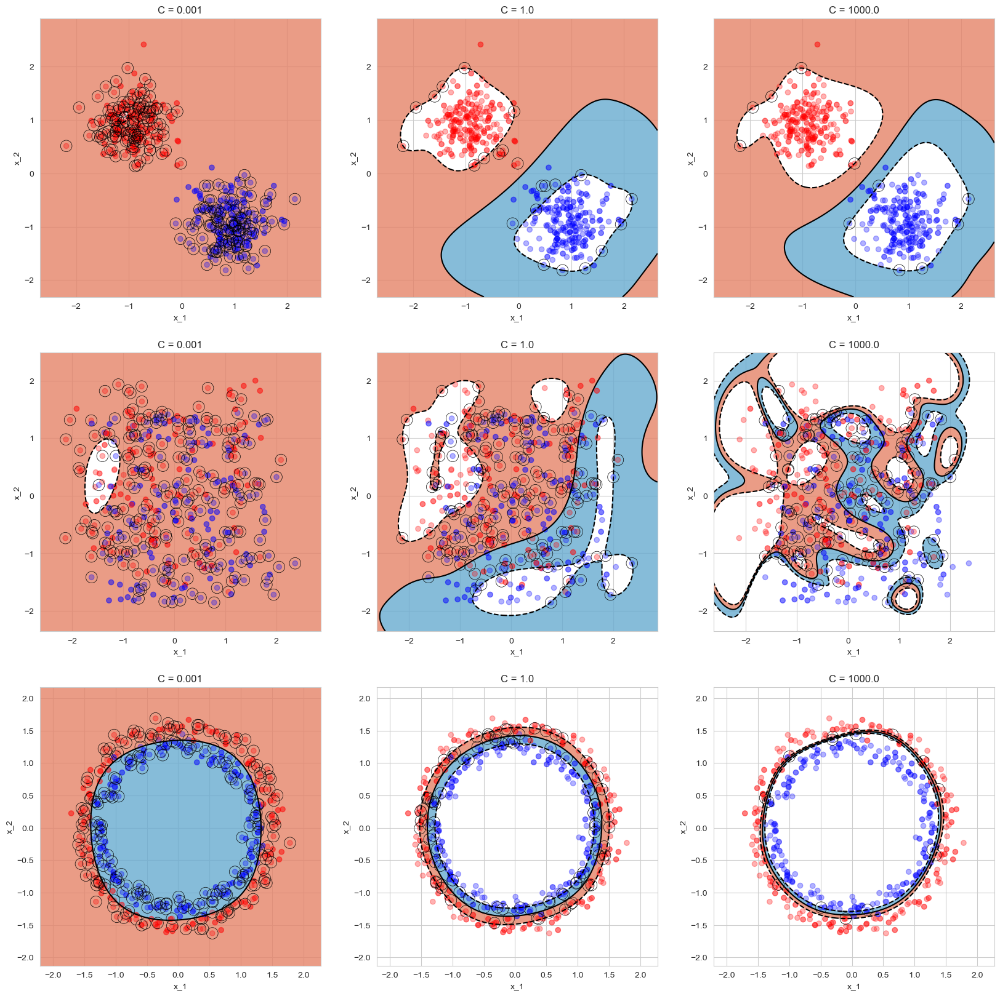

In [91]:
classifiers = []
name = []
# YOUR CODE HERE

C_range = np.logspace(-3, 3, num = 3)

for C in C_range:
    clf = SVC(C = C)
    classifiers.append(clf)
    name.append('C = {}'.format(C))

svc_plotter(classifiers, 
            name, 
            poly_f=True, 
            polynomial_expand=PolynomialFeatures(include_bias = False))

# Kernel SVM

![](http://i.imgur.com/bJAzRCt.png)

Задача Линера SVM, рассмотренная выше, обычно называется прямой оптимизационной задачей. Любая прямая задача имеет $\textbf{двойственную}$ задачу и в некоторых случаях оптимумы обеих задач совпадают

Двойственная задача для SVM состоит в следующем:
$$\begin{gather} 
    \sum_{n} \alpha_n - \frac{1}{2}\sum_{n}\sum_{n'} \alpha_{n}\alpha_{n'} y_{n}y_{n'} x_{n}^Tx_{n'} \to \max_{\alpha} \\\\
        \begin{aligned}
            \text{s.t. } \quad 0 \le \alpha_n \le C, \quad \forall n = 1, \dots, N \\\\
            \sum_{n} \alpha_n y_n = 0
        \end{aligned}
\end{gather}$$

Вектор двойных переменных оптимизируется $\alpha_n$. Объект $x_n$ является SV, если $\alpha_n > 0$

Предсказанная метка задается:
$$\hat{y}(x) = \text{sign}\left(\sum_{n}\alpha_{n}y_{n}x^Tx_{n} + b\right)$$

### Трюк с ядром

Обратите внимание, что двойственная задача имеет свойства только в виде скалярного произведения $x^Tx'$. Это наблюдение помогает нам выполнить трюк с ядром - неявно изменить пространство признаков. Вместо того, чтобы вычислять $\phi(\boldsymbol x)$ (как мы делали раньше) мы будем вычислять скалярное произведение $k(\boldsymbol x, \boldsymbol x')$ называемое $\textbf{kernel}$ и подставим его вместо $x^Tx'$ выше.

# Задача 4

Попробуйте разные ядра SVM и постройте графики, как описано выше, посмотрите, какие еще параметры имеют ядра и как они влияют на результаты

- polynomial: $k(x, x') = (x^Tx' + 1)^d$ с разными $d = 2,3,\dots$
- Gaussian RBF: $k(x, x') = \exp(-\sigma\|x - x'\|^2)$

### Poly kernel
##### degree=2

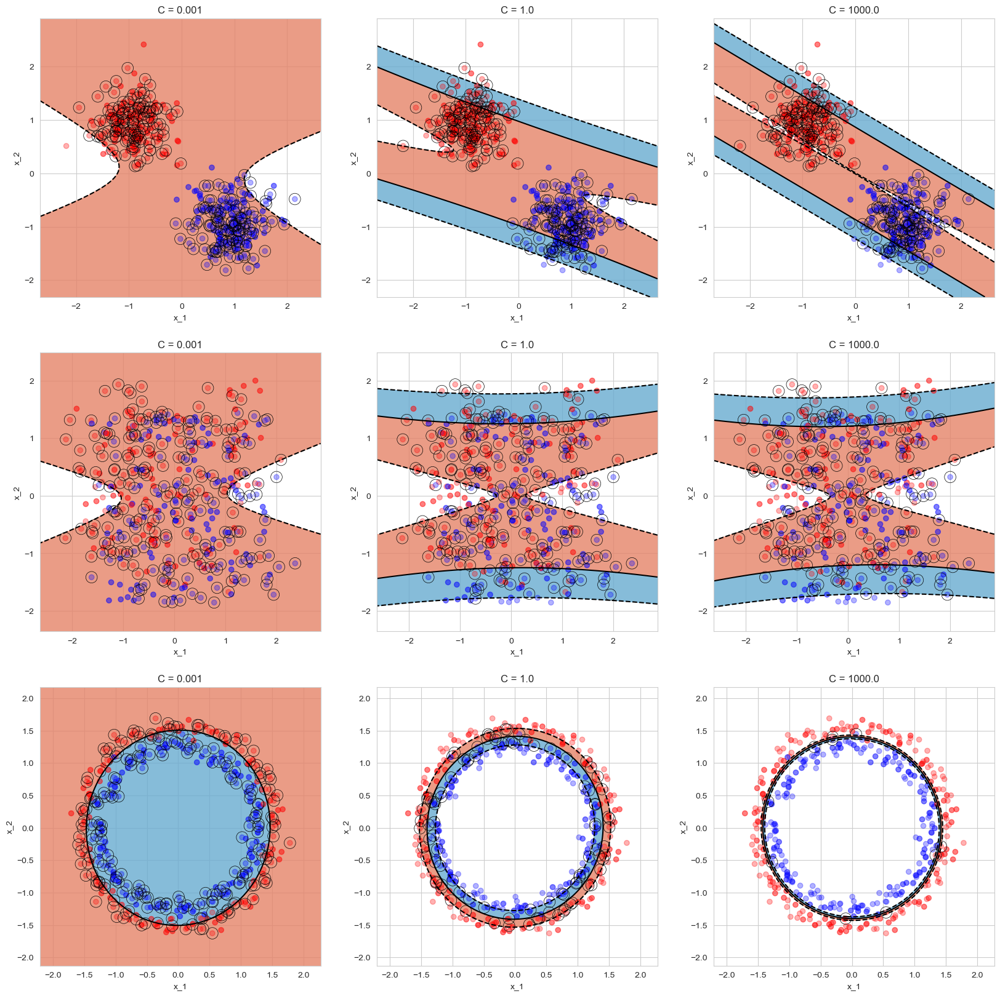

In [92]:
classifiers = []
name = []
# YOUR CODE HERE
C_range = np.logspace(-3, 3, num = 3)
for C in C_range:
    clf = SVC(C = C, degree = 2, kernel = 'poly')
    classifiers.append(clf)
    name.append('C = {}'.format(C))

svc_plotter(classifiers, name)

##### degree=5

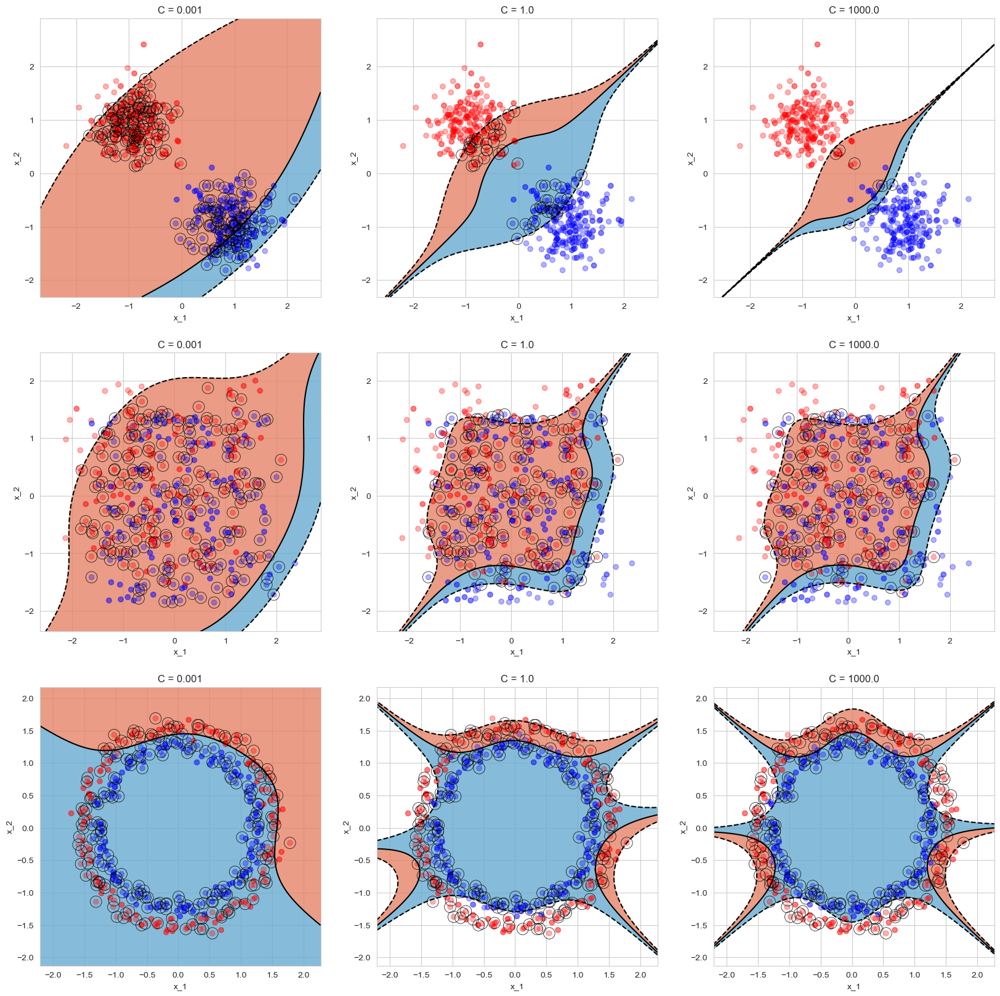

In [93]:
classifiers = []
name = []
# YOUR CODE HERE
C_range = np.logspace(-3, 3, num = 3)
for C in C_range:
    clf = SVC(C = C, degree = 5, kernel = 'poly')
    classifiers.append(clf)
    name.append('C = {}'.format(C))

svc_plotter(classifiers, name)

##### degree=10

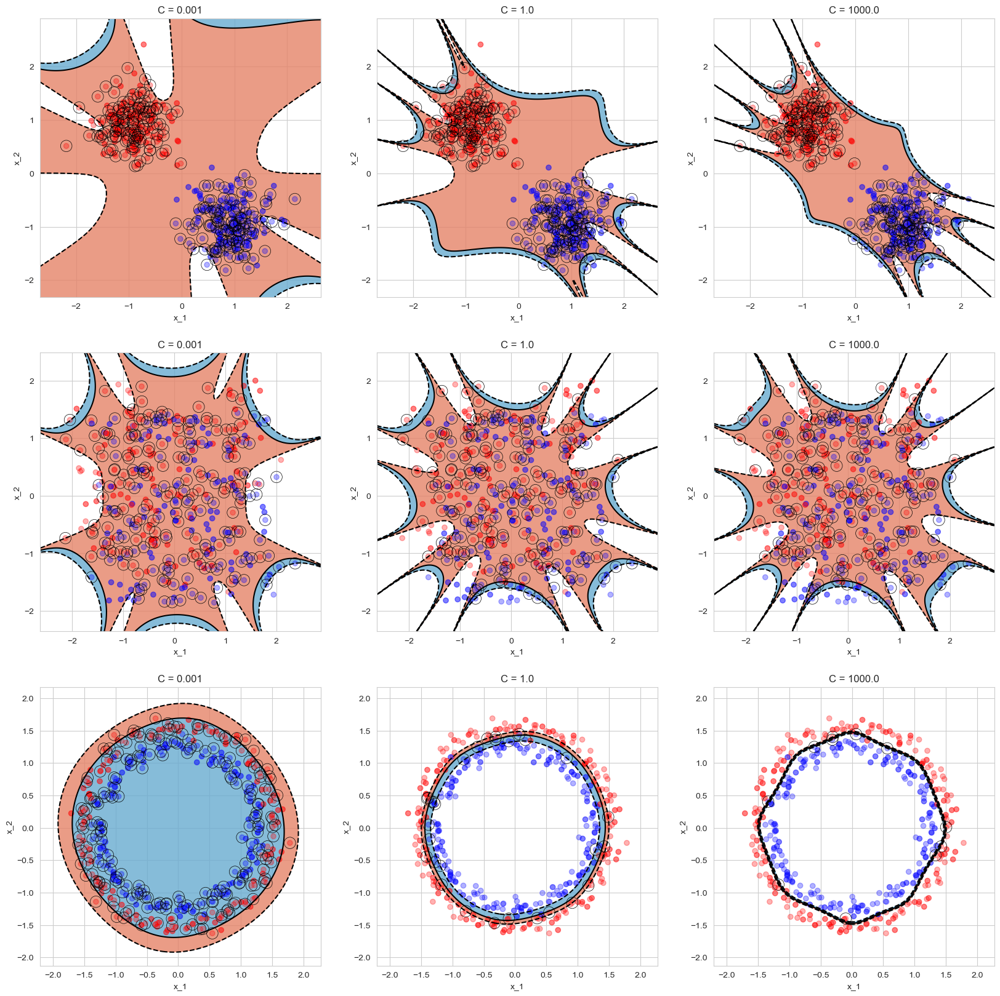

In [94]:
classifiers = []
name = []
# YOUR CODE HERE
C_range = np.logspace(-3, 3, num = 3)
for C in C_range:
    clf = SVC(C = C, degree = 10, kernel = 'poly')
    classifiers.append(clf)
    name.append('C = {}'.format(C))

svc_plotter(classifiers, name)

# RBF kernel(варьировать параметр гамма в logscale)

Параметр gamma в SVM с радиальным базисным функциональным ядром (RBF) определяет, как далеко влияют одиночные образцы на формирование границы решения. Более конкретно, gamma определяет, как быстро расходится функция ядра RBF, когда расстояние между двумя точками увеличивается.

Если увеличить значение gamma, то граница решения будет более "неровной" и "сложной", что может привести к переобучению модели. Если уменьшить значение gamma, то граница решения будет более "гладкой" и "простой", что может привести к недообучению модели.

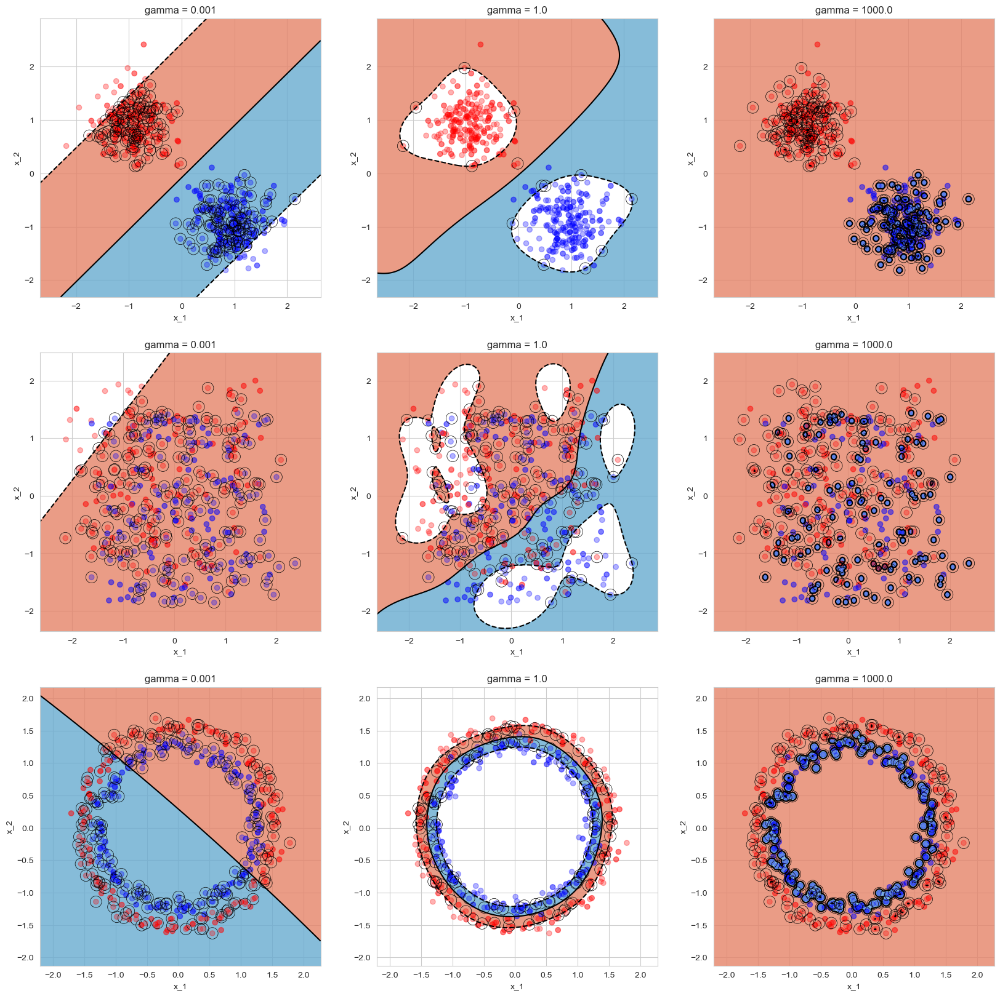

In [95]:
classifiers = []
name = []
# YOUR CODE HERE
gamma_range = np.logspace(-3, 3, num = 3)
for gamma in gamma_range:
    clf = SVC(C = 1, kernel = 'rbf', gamma = gamma)
    classifiers.append(clf)
    name.append('gamma = {}'.format(gamma))

svc_plotter(classifiers, name)